<h1 style="font-size:30px;">Fine-Tuning KerasCV YOLOv8 Large Model</h1>

## Install Dependencies

In [1]:
!pip install -q pycocotools
!pip install --upgrade git+https://github.com/keras-team/keras-cv -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 14.6 MB/s eta 0:00:00


## Imports

In [2]:
import os
import glob
import random
import requests
from zipfile import ZipFile

from dataclasses import dataclass, field
import xml.etree.ElementTree as ET

from tqdm import tqdm
import numpy as np
import cv2

import tensorflow as tf
import keras_cv
from keras_cv import bounding_box

import matplotlib.pyplot as plt

Using TensorFlow backend


### Setting Seeds for Reproducibilty

In [3]:
def system_config(SEED_VALUE):

    random.seed(SEED_VALUE)
    tf.keras.utils.set_random_seed(SEED_VALUE)

    # Get list of GPUs.
    gpu_devices = tf.config.list_physical_devices('GPU')

    os.environ["CUDA_VISIBLE_DEVICES"] = '0'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

    # Grow the memory usage as the process needs it.
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)

    # Enable using cudNN.
    os.environ['TF_USE_CUDNN'] = "true"

system_config(SEED_VALUE=42)

## Download and Extract Dataset

In [4]:
# Download and dataset.
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # Extract tarfile.
        if save_path.endswith(".zip"):
            with ZipFile(save_path) as zip:
                zip.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [5]:
DATASET_URL = r"https://www.dropbox.com/scl/fi/3gp2mqp1okiyevwnr5pbc/global-wheat-detection.zip?rlkey=kbui4gafys0lok8dqj54li6bj&dl=1"
DATASET_DIR = "global-wheat-detection"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Download if dataset does not exists.
if not os.path.exists(DATASET_DIR):
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH)
    os.remove(DATASET_ZIP_PATH)

## Configurations

### Dataset Configuration

In [6]:
@dataclass(frozen=True)
class DatasetConfig:
    DATA_PATH:           str = DATASET_DIR
    IMG_PATH:            str = os.path.join(DATASET_DIR, "images")
    ANN_PATH:            str = os.path.join(DATASET_DIR, "annotations")
    IMAGE_SIZE:        tuple = (832, 832)
    VAL_SPLIT:         float = 0.05
    BATCH_SIZE:          int = 16
    HUE_FACTOR:        float = 0.015
    BRIGHTNESS_FACTOR: float = 0.25
    SATURATION_FACTOR: float = 0.80
    TRANS_H_FACTOR:    float = 0.1
    TRANS_W_FACTOR:    float = 0.1
    JITTER_RSZ_FACTOR: tuple = (0.8, 1.25)
    CLASSES_DICT:       dict = field(default_factory = lambda:{0 : "wheat_head"})

## Training Configuration

In [7]:
@dataclass(frozen=True)
class TrainingConfig:
    BACKBONE:  str = "yolo_v8_l_backbone_coco"
    EPOCHS:    int = 50
    INIT_LR: float = 2e-3
    FINAL_LR:float = 1e-2
    DECAY:   float = 5e-4
    CKPT_DIR:  str = os.path.join("checkpoints_"+"_".join(BACKBONE.split("_")[:3]),
                                  "_".join(BACKBONE.split("_")[:3])+".h5")
    LOGS_DIR:  str = "logs_"+"_".join(BACKBONE.split("_")[:3])

In [8]:
train_config = TrainingConfig()
data_config = DatasetConfig()

In [9]:
IMAGE_PATHS = sorted(glob.glob(os.path.join(data_config.IMG_PATH, "*.jpg")))
ANN_PATHS = sorted(glob.glob(os.path.join(data_config.ANN_PATH, "*.xml")))

# Shuffle the data paths before data preparation.
zipped_data = list(zip(IMAGE_PATHS, ANN_PATHS))
random.shuffle(zipped_data)

IMAGE_PATHS, ANN_PATHS = zip(*zipped_data)
IMAGE_PATHS, ANN_PATHS = list(IMAGE_PATHS), list(ANN_PATHS)

## Parsing Annotations

In [10]:
def parse_annotation(xml_file, data_config = DatasetConfig()):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    class_mapping = data_config.CLASSES_DICT

    bboxes = []
    classes = []
    for obj in root.iter("object"):
        cls = obj.find("name").text

        bbox = obj.find("bndbox")
        xmin = float(bbox.find("xmin").text)
        ymin = float(bbox.find("ymin").text)
        xmax = float(bbox.find("xmax").text)
        ymax = float(bbox.find("ymax").text)

        classes.append(cls)
        bboxes.append([xmin, ymin, xmax, ymax])

    class_ids = [
        list(class_mapping.keys())[list(class_mapping.values()).index(cls)]
        for cls in classes
    ]
    return bboxes, class_ids

In [11]:
ALL_BBOX_COORDS = []
ALL_CLASS_IDS = []

for xml_file in tqdm(ANN_PATHS):
    boxes, class_ids = parse_annotation(xml_file)
    ALL_BBOX_COORDS.append(boxes)
    ALL_CLASS_IDS.append(class_ids)

100%|██████████| 3373/3373 [00:02<00:00, 1393.00it/s]


## Dataset Preparation using the tf.data API¶

In [12]:
image_path_tensors  = tf.ragged.constant(IMAGE_PATHS)
bbox_coords_tensors = tf.ragged.constant(ALL_BBOX_COORDS)
class_id_tensors    = tf.ragged.constant(ALL_CLASS_IDS)


data = tf.data.Dataset.from_tensor_slices((image_path_tensors,
                                           bbox_coords_tensors,
                                           class_id_tensors))

### Train and Validation Splits

In [13]:
# Determine the number of validation samples
NUM_VAL = int(len(ANN_PATHS) * data_config.VAL_SPLIT)

# Split the dataset into train and validation sets
train_data = data.skip(NUM_VAL)
val_data = data.take(NUM_VAL)

## Load and Resize Data

### Load and Resize Image

In [14]:
def load_resize_image(
    image_path,
    resize_image=False,
    size=data_config.IMAGE_SIZE):

    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, channels=3)
    image.set_shape([None, None, 3])

    og_image_shape = tf.shape(image)[:2]

    if resize_image:
        image = tf.image.resize(images=image, size=size, method = "bicubic")
        image = tf.cast(tf.clip_by_value(image, 0., 255.), tf.float32)
    else:
        image = tf.cast(image, tf.float32)

    return image, og_image_shape

### Resize Bounding Box Data

In [15]:
def box_resize(bbox_coords, im_shape, resize=data_config.IMAGE_SIZE):

    resize_wh = list(resize[::-1])
    ratio_wh  = resize_wh / im_shape
    ratio_multipler = tf.cast(tf.concat([ratio_wh, ratio_wh], axis=-1), tf.float32)

    bbox_resize = bbox_coords * ratio_multipler
    bbox_resize = tf.clip_by_value(bbox_resize,
                                   clip_value_min=[0., 0., 0., 0.],
                                   clip_value_max=resize_wh+resize_wh
                                  )
    return bbox_resize

In [16]:
def load_dataset(image_path, bbox_coords, class_ids, resize_data=False):
    # Read Image
    image, og_im_shape = load_resize_image(image_path, resize_image=resize_data)
    bbox_tensor = bbox_coords.to_tensor()

    if resize_data:
        bbox_tensor = box_resize(bbox_tensor, og_im_shape)

    bounding_boxes = {
        "classes": tf.cast(class_ids, dtype=tf.float32),
        "boxes": bbox_tensor,
    }
    return {"images": tf.cast(image, tf.float32),
            "bounding_boxes": bounding_boxes}

## Data Augmentation

In [17]:
augmenter = tf.keras.Sequential(
            layers=[

                keras_cv.layers.RandomTranslation(
                    height_factor=data_config.TRANS_H_FACTOR,
                    width_factor=data_config.TRANS_W_FACTOR,
                    bounding_box_format="xyxy"),

                keras_cv.layers.RandomHue(factor=data_config.HUE_FACTOR,
                                         value_range=(0., 255.)),
                keras_cv.layers.RandomBrightness(factor=data_config.BRIGHTNESS_FACTOR,
                                                value_range=(0., 255.)),
                keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xyxy"),
                keras_cv.layers.JitteredResize(
                    target_size=data_config.IMAGE_SIZE,
                    scale_factor=data_config.JITTER_RSZ_FACTOR,
                    bounding_box_format="xyxy"
                ),
            ],
            name="Augment_Layer"
)

## Creating Training Dataset

In [18]:
train_dataset = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(data_config.BATCH_SIZE * 2)
train_dataset = train_dataset.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.ragged_batch(data_config.BATCH_SIZE, drop_remainder=False)

## Creating Validation Dataset

In [19]:
valid_dataset = val_data.map(lambda pths,box, cls: load_dataset(pths,box,cls,resize_data=True),
                             num_parallel_calls=tf.data.AUTOTUNE)
valid_dataset = valid_dataset.ragged_batch(data_config.BATCH_SIZE, drop_remainder=False)

## Unpacking Training and Validation Data

In [20]:
def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


train_dataset = train_dataset.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)

valid_dataset = valid_dataset.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
valid_dataset = valid_dataset.prefetch(tf.data.AUTOTUNE)

## Ground Truth Visualization

In [21]:
def draw_bbox(
    image,
    boxes,
    classes,
    scores=None,
    color=(255, 0, 0),
    thickness=-1):

    overlay = image.copy()

    # Reference:
    # https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/training/utils/visualization/detection.py

    font_size = 0.25 + 0.07 * min(overlay.shape[:2]) / 100
    font_size = max(font_size, 0.5)
    font_size = min(font_size, 0.8)
    text_offset = 7

    for idx, (box, cls) in enumerate(zip(boxes, classes)):
        xmin, ymin, xmax, ymax = box[0], box[1], box[2], box[3]

        overlay = cv2.rectangle(overlay, (xmin, ymin), (xmax, ymax), color, thickness)

        display_text = f"{data_config.CLASSES_DICT[cls]}"

        if scores is not None:
            display_text+= f": {scores[idx]:.2f}"

        (text_width, text_height), _ = cv2.getTextSize(display_text, cv2.FONT_HERSHEY_SIMPLEX, font_size, 2)

        cv2.rectangle(overlay,
                      (xmin, ymin),
                      (xmin + text_width + text_offset, ymin - text_height - int(15 * font_size)),
                      color, thickness=-1)


        overlay = cv2.putText(
                    overlay,
                    display_text,
                    (xmin + text_offset, ymin - int(10 * font_size)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    font_size,
                    (255, 255, 255),
                    2, lineType=cv2.LINE_AA,
                )

    return cv2.addWeighted(overlay, 0.75, image, 0.25, 0)

### Augmented Training Data Visualization

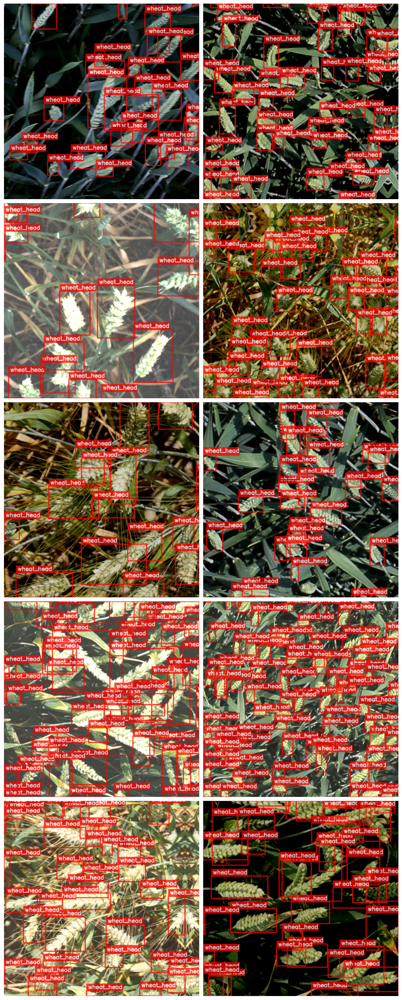

In [22]:
fig = plt.figure(figsize=(10, 25), layout="constrained")

count = 0
stop_iter = False

for idx, batch_sample in enumerate(train_dataset):
    if stop_iter:
        break

    batch_imgs, batch_boxes, batch_cls = batch_sample[0], batch_sample[1]["boxes"], batch_sample[1]["classes"]

    for img, boxes, classes in zip(batch_imgs, batch_boxes, batch_cls):
        if count >= 10:
            stop_iter = True
            break
        img = np.clip(img.numpy(), 0., 255.).astype("uint8")
        boxes = boxes.numpy().astype("int").tolist()
        class_ids = classes.numpy().astype("int").tolist()
        img_ann = draw_bbox(img,
                            boxes,
                            class_ids,
                            color=(255, 0, 0),
                            thickness=3)

        count+=1

        ax = plt.subplot(5, 2, count)
        plt.imshow(img_ann)
        plt.axis("off")

plt.show()

### Validation Data Visualization

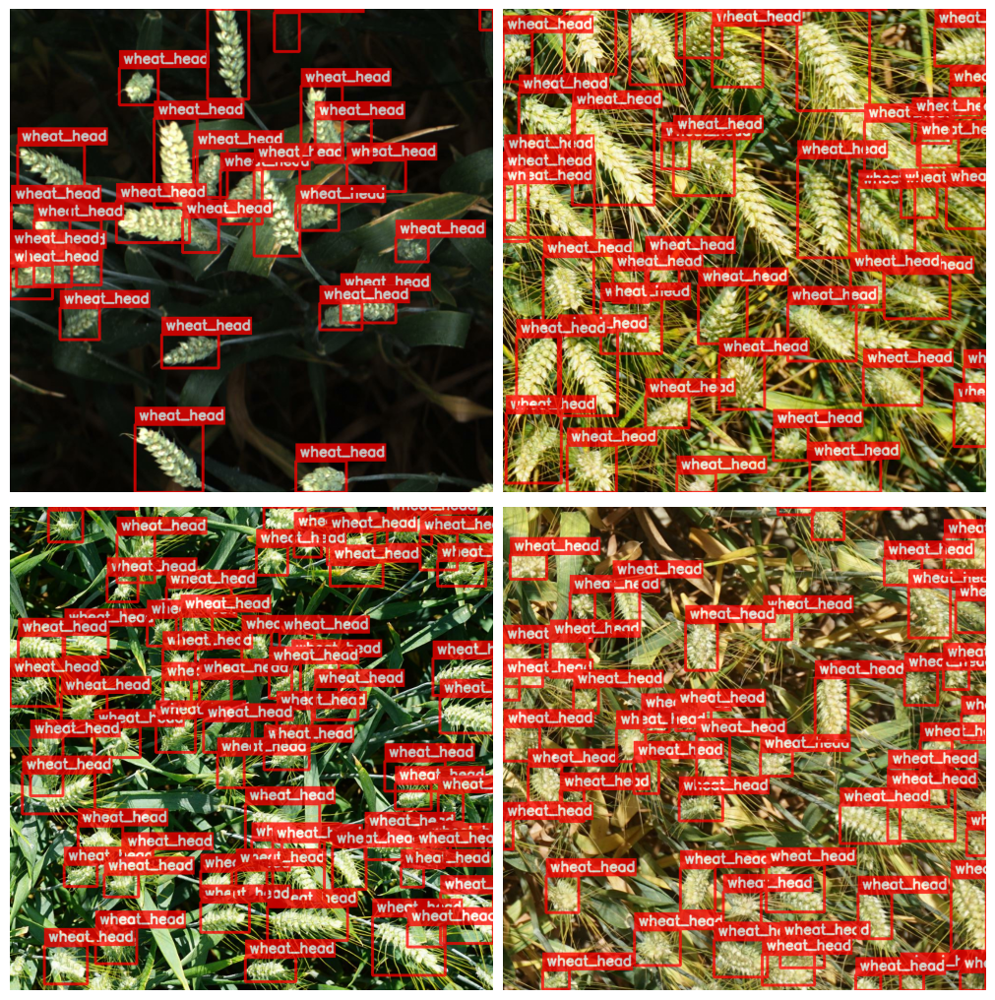

In [23]:
fig = plt.figure(figsize=(10, 25), layout="constrained")

count = 0
stop_iter = False

for idx, batch_sample in enumerate(valid_dataset):
    if stop_iter:
        break

    batch_imgs, batch_boxes, batch_cls = batch_sample[0], batch_sample[1]["boxes"], batch_sample[1]["classes"]

    for img, boxes, classes in zip(batch_imgs, batch_boxes, batch_cls):
        if count >= 4:
            stop_iter = True
            break
        img = np.clip(img.numpy(), 0., 255.).astype("uint8")
        boxes = boxes.numpy().astype("int").tolist()
        class_ids = classes.numpy().astype("int").tolist()
        img_ann = draw_bbox(img,
                            boxes,
                            class_ids,
                            color=(255, 0, 0),
                            thickness=3)

        count+=1

        ax = plt.subplot(5, 2, count)
        plt.imshow(img_ann)
        plt.axis("off")

plt.show()

## KerasCV YOLOv8 Large Model Creation

### Defining Backbone Preset

In [24]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
            train_config.BACKBONE, load_weights=True)

79778896/79778896 [==============================] - 5s 0us/step


### Initializing YOLOv8 Detector Head

In [25]:
yolo = keras_cv.models.YOLOV8Detector(
    num_classes=len(data_config.CLASSES_DICT),
    bounding_box_format="xyxy",
    backbone=backbone,
    fpn_depth=3,
)

print(yolo.summary())

Model: "yolov8_detector"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 model (Functional)          {'P3': (None, None, None,    1983174   ['input_2[0][0]']             
                             256),                        4                                       
                              'P4': (None, None, None,                                            
                             512),                                                                
                              'P5': (None, None, None,                                            
                             512)}                                                  

## Scheduler, TensorBoard and Metrics Callbacks

### Scheduler Function

In [26]:
def scheduler(epoch, lr):
    return train_config.INIT_LR*(tf.multiply((1 - epoch / train_config.EPOCHS),
                                             (1.0 - train_config.FINAL_LR))
                                 + train_config.FINAL_LR)

### Adding Tensorboard Callbacks

In [27]:
def get_callbacks(train_config):

    scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

    # Initialize tensorboard callback for logging.
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
        log_dir=train_config.LOGS_DIR,
        histogram_freq=20,
        write_graph=False,
        update_freq="epoch",
    )

    return scheduler_callback, tensorboard_callback

### COCO Evaluation Metric Callback

In [28]:
class EvaluateCOCOMetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, data, save_path):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xyxy",
            evaluate_freq=1e9,
        )

        self.save_path = save_path
        self._options = tf.train.CheckpointOptions()
        self.best_map = -1.0
        self.ckpt_dir = save_path.split("/")[0]
        os.makedirs(self.ckpt_dir, exist_ok=True)

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for i, batch in enumerate(self.data):
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            y_pred_ragged = bounding_box.to_ragged(y_pred)

            self.metrics.update_state(y_true, y_pred_ragged)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        current_map = metrics["MaP"]
        if current_map > self.best_map:
            tf.print(f"\nmAP Improved. Saving model...")
            self.best_map = current_map
            self.model.save_weights(self.save_path, overwrite=True, options=self._options)  # Save the model when mAP improves

        return logs


## Model Compilation

In [29]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=train_config.INIT_LR,
    weight_decay=train_config.DECAY
)

scheduler_callback, tb_callback = get_callbacks(train_config)

yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou"
)

## Training and Fine-Tuning

In [30]:
history = yolo.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=train_config.EPOCHS,
    callbacks=[EvaluateCOCOMetricsCallback(valid_dataset, train_config.CKPT_DIR),
               scheduler_callback,
               tb_callback]
)

Epoch 1/50
201/201 [==============================] - ETA: 0s - loss: 12.4454 - box_loss: 3.2324 - class_loss: 9.2130
mAP Improved. Saving model...
201/201 [==============================] - 223s 746ms/step - loss: 12.4454 - box_loss: 3.2324 - class_loss: 9.2130 - val_loss: 5.7442 - val_box_loss: 3.2433 - val_class_loss: 2.5010 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00 - lr: 0.0020
Epoch 2/50
201/201 [==============================] - ETA: 0s - loss: 4.8686 - box_loss: 2.5269 - class_loss: 2.3417
mAP Improved. Saving model...
201/201 [==============================] - 145s 717ms/step - loss: 4.8686 - box_loss: 2.5269 - class_loss: 2.3417 - va

## Load Model Weights

In [31]:
yolo.load_weights(train_config.CKPT_DIR)

## Prediction Visualization for YOLOv8 Medium

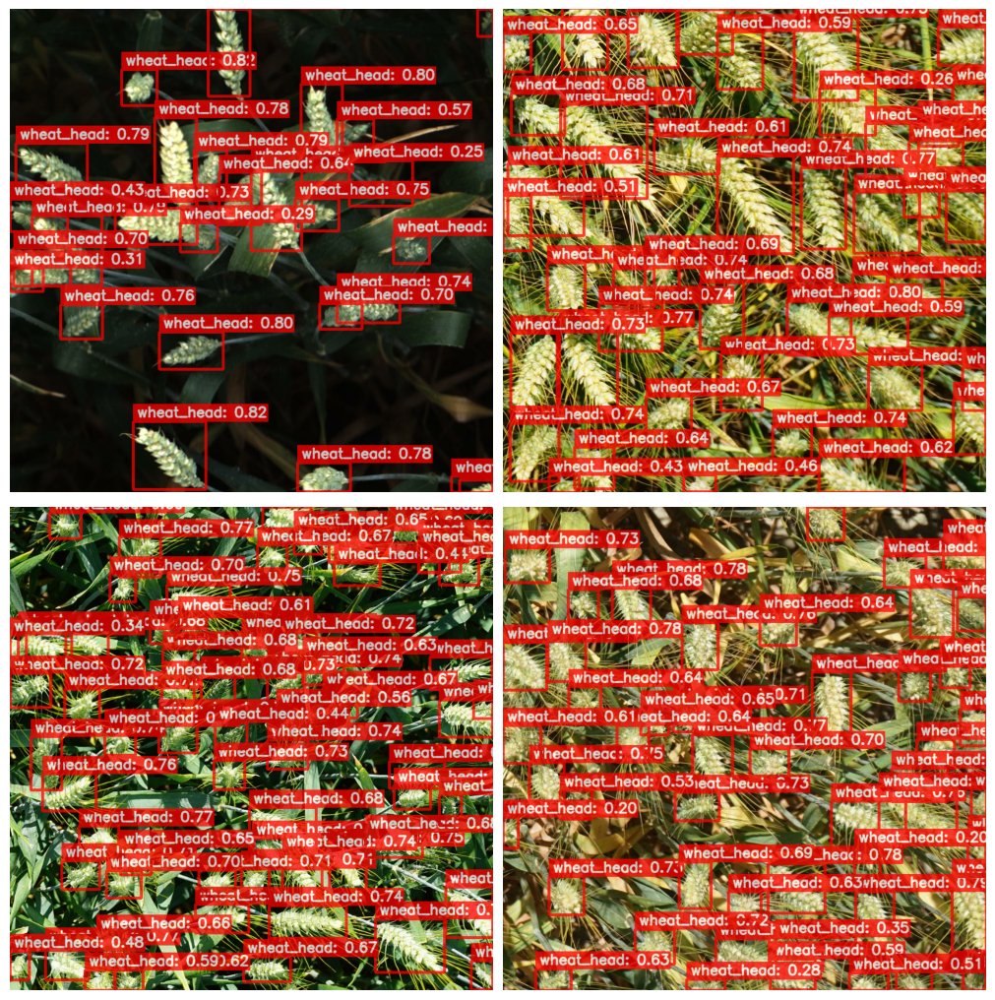

In [32]:
fig = plt.figure(figsize=(10, 25), layout="constrained")

count = 0
stop_iter = False

for idx, batch_sample in enumerate(valid_dataset):
    if stop_iter:
        break

    batch_imgs = batch_sample[0]
    pred_batch = yolo.predict(batch_imgs, verbose=0)
    pred_batch = bounding_box.to_ragged(pred_batch)

    pred_boxes = pred_batch["boxes"]
    pred_cls = pred_batch["classes"]
    pred_confs = pred_batch["confidence"]

    for img, boxes, classes, scores in zip(batch_imgs, pred_boxes, pred_cls, pred_confs):
        if count >= 4:
            stop_iter = True
            break
        img = np.clip(img.numpy(), 0., 255.).astype("uint8")
        boxes = boxes.numpy().astype("int").tolist()
        class_ids = classes.numpy().astype("int").tolist()
        confs = scores.numpy().astype("float").tolist()
        img_ann = draw_bbox(img,
                            boxes,
                            class_ids,
                            scores,
                            color=(255, 0, 0),
                            thickness=3)

        count+=1

        ax = plt.subplot(5, 2, count)
        plt.imshow(img_ann)
        plt.axis("off")

plt.show()